# Visual Overlay Analysis - Voynich Manuscript

This notebook demonstrates the visual overlay system for the Voynich Manuscript decoder project.

**Features:**
- Load and display manuscript folio images
- Overlay token bounding boxes with color-coding
- Interactive visualization of token distributions
- Export high-quality annotated images

**Requirements:**
- Folio images in `data/external/images/`
- Token coordinates in `data/processed/token_coords.jsonl`

In [16]:
# Setup and imports
import sys
from pathlib import Path
import json
import matplotlib.pyplot as plt
from PIL import Image
import importlib

# Set working directory to project root
import os
os.chdir('..')
print(f"📁 Changed to: {Path('.').resolve()}")

# Add src to path
sys.path.insert(0, str(Path('.').resolve()))

# Import visualization module
from src.visualization import overlay
# Force reload to get updated paths
importlib.reload(overlay)

# Configure matplotlib
plt.rcParams['figure.figsize'] = (16, 10)
plt.rcParams['figure.dpi'] = 100

print("✅ Imports loaded successfully")
print(f"📍 Using data from: {overlay.ROOT}")

📁 Changed to: /home/tiago
✅ Imports loaded successfully
📍 Using data from: /home/tiago/Documents/GitHub/voynich-decoder


## 1. Load Token Coordinates

Load the generated token coordinates and inspect the data structure.

In [8]:
# Load coordinates
coords = overlay.load_coords()

print(f"📊 Loaded {len(coords)} token coordinates")
print(f"\n🔍 Sample coordinate record:")
if coords:
    print(json.dumps(coords[0], indent=2))
    
    # Show statistics
    folios = sorted(set(r['folio'] for r in coords))
    tokens = sorted(set(r['token'] for r in coords))
    
    print(f"\n📄 Folios with coordinates: {len(folios)}")
    print(f"   {', '.join(folios)}")
    print(f"\n🔤 Unique tokens: {len(tokens)}")
    print(f"   {', '.join(tokens)}")

📊 Loaded 14 token coordinates

🔍 Sample coordinate record:
{
  "token": "qokedy",
  "folio": "103v",
  "bbox": [
    205,
    297,
    72,
    40
  ],
  "line_id": 1,
  "token_index": 1
}

📄 Folios with coordinates: 5
   103v, 104r, 1r, 24v, 25r

🔤 Unique tokens: 10
   cheedy, end, ixaiin, n, of, qokedy, sample, tokeey, unclear, zot


## 2. Display Generated Overlays

Show the pre-generated overlay images with color-coded tokens.

In [10]:
# Generate all overlays
print("🎨 Generating overlays for all folios...")
outputs = overlay.generate_all_overlays(
    limit=20,
    color_by_token=True,
    show_labels=True,
    show_legend=True
)
print(f"\n✅ Generated {len(outputs)} overlays")

🎨 Generating overlays for all folios...
Generating overlays for 5 folios (limit=20)
Wrote overlay to /home/tiago/Documents/GitHub/voynich-decoder/reports/figures/overlays/overlay_103v.png
Wrote overlay to /home/tiago/Documents/GitHub/voynich-decoder/reports/figures/overlays/overlay_104r.png
Wrote overlay to /home/tiago/Documents/GitHub/voynich-decoder/reports/figures/overlays/overlay_1r.png
Wrote overlay to /home/tiago/Documents/GitHub/voynich-decoder/reports/figures/overlays/overlay_24v.png
Wrote overlay to /home/tiago/Documents/GitHub/voynich-decoder/reports/figures/overlays/overlay_25r.png

Generated 5 overlay images

✅ Generated 5 overlays


Found 5 overlay images in /home/tiago/Documents/GitHub/voynich-decoder/reports/figures/overlays


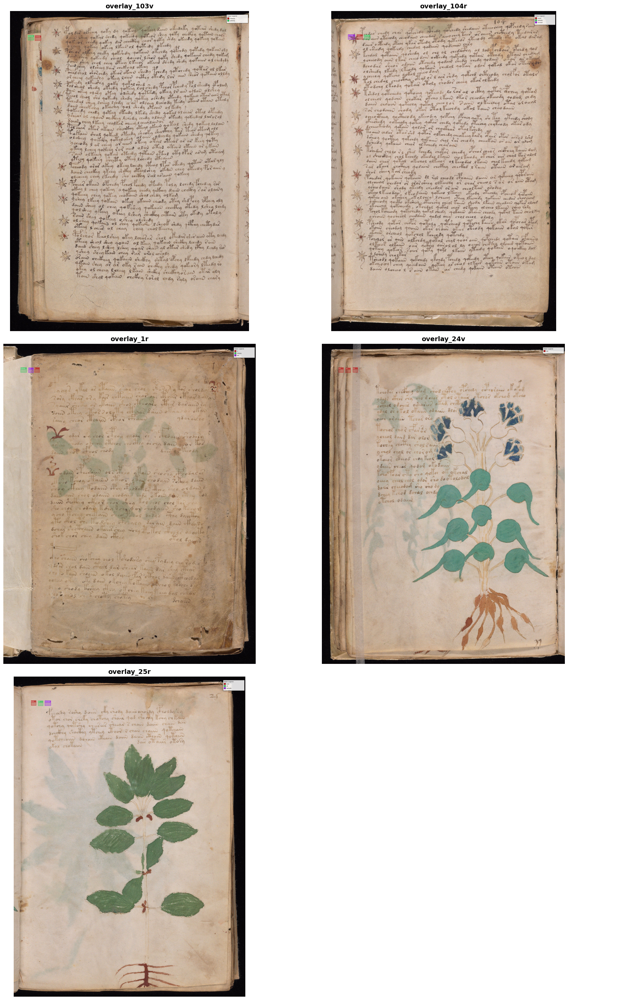

In [12]:
# Display all generated overlays
overlay_dir = overlay.OUT
overlay_files = sorted(overlay_dir.glob('overlay_*.png'))

print(f"Found {len(overlay_files)} overlay images in {overlay_dir}")

if len(overlay_files) == 0:
    print("⚠️ No overlays found. Run the previous cell to generate them first.")
else:
    # Display in a grid
    n_cols = 2
    n_rows = (len(overlay_files) + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10 * n_rows))
    if n_rows == 1:
        axes = axes.reshape(1, -1)

    for idx, img_path in enumerate(overlay_files):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]
        
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(img_path.stem, fontsize=14, fontweight='bold')
        ax.axis('off')

    # Hide empty subplots
    for idx in range(len(overlay_files), n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.show()

## 3. Interactive Overlay Generation

Generate a custom overlay for a specific folio with configurable parameters.

🎨 Generating custom overlay for folio: 1r
Wrote overlay to ../reports/figures/overlays/custom/overlay_1r.png


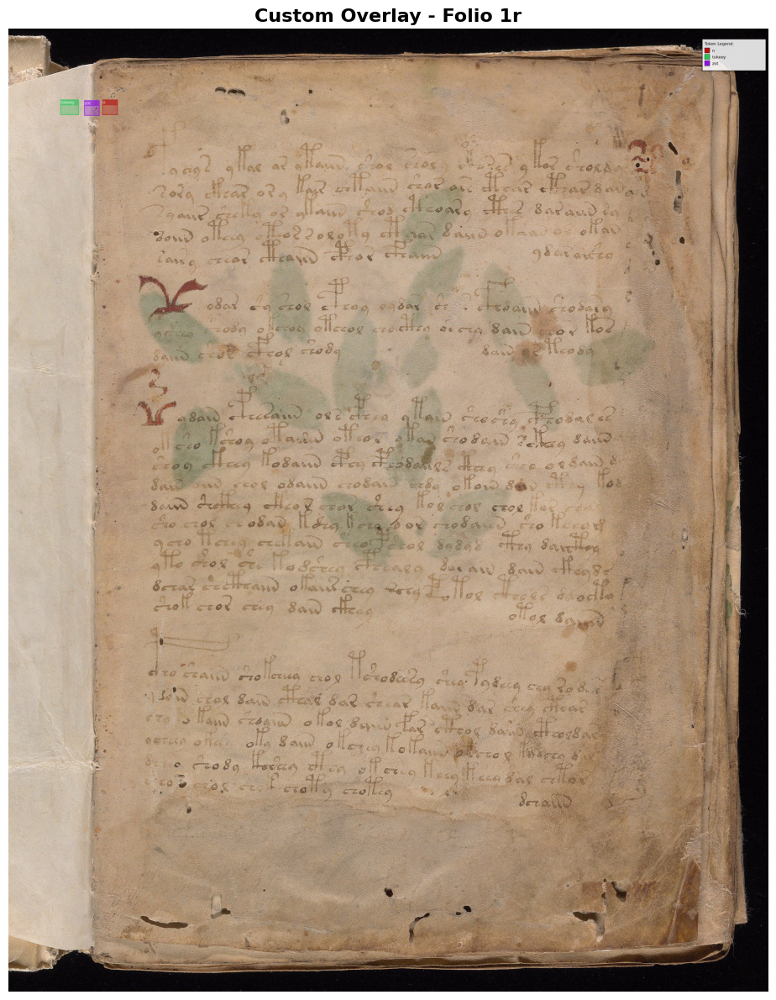

✅ Saved to: ../reports/figures/overlays/custom/overlay_1r.png


In [14]:
# Choose a folio and generate custom overlay
target_folio = '1r'  # Change this to any available folio

print(f"🎨 Generating custom overlay for folio: {target_folio}")

# Generate with different options
custom_out = Path('../reports/figures/overlays/custom')
custom_out.mkdir(parents=True, exist_ok=True)

# Option 1: With legend and labels
overlay.overlays_for_folio(
    target_folio, 
    coords, 
    out_dir=custom_out,
    color_by_token=True,
    show_labels=True,
    show_legend=True
)

# Display result
custom_img = custom_out / f'overlay_{target_folio}.png'
if custom_img.exists():
    img = Image.open(custom_img)
    plt.figure(figsize=(18, 12))
    plt.imshow(img)
    plt.title(f'Custom Overlay - Folio {target_folio}', fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    print(f"✅ Saved to: {custom_img}")

## 4. Token Distribution Analysis

Visualize the distribution of tokens across folios.

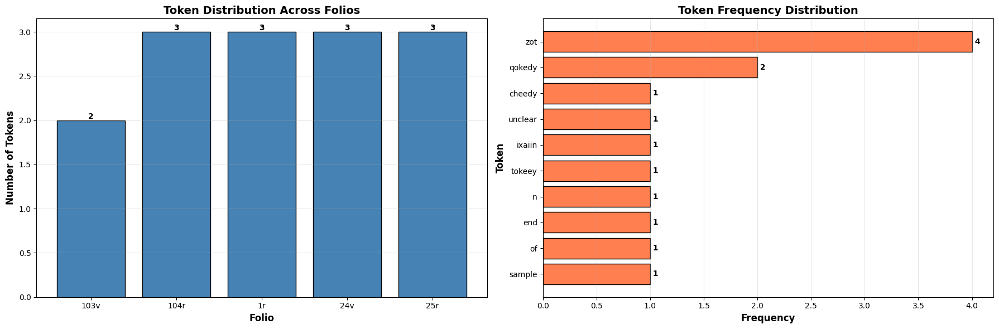


📊 Summary Statistics:
   Total tokens: 14
   Unique tokens: 10
   Folios: 5
   Most common token: 'zot' (4 occurrences)


In [15]:
# Analyze token distribution
from collections import Counter

# Count tokens per folio
folio_tokens = {}
for rec in coords:
    folio = rec['folio']
    if folio not in folio_tokens:
        folio_tokens[folio] = []
    folio_tokens[folio].append(rec['token'])

# Overall token frequency
all_tokens = [r['token'] for r in coords]
token_freq = Counter(all_tokens)

# Create visualizations
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# 1. Tokens per folio
ax1 = axes[0]
folios_sorted = sorted(folio_tokens.keys())
counts = [len(folio_tokens[f]) for f in folios_sorted]
bars = ax1.bar(folios_sorted, counts, color='steelblue', edgecolor='black')
ax1.set_xlabel('Folio', fontsize=12, fontweight='bold')
ax1.set_ylabel('Number of Tokens', fontsize=12, fontweight='bold')
ax1.set_title('Token Distribution Across Folios', fontsize=14, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)

# Add value labels on bars
for bar, count in zip(bars, counts):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(count)}',
             ha='center', va='bottom', fontsize=10, fontweight='bold')

# 2. Token frequency
ax2 = axes[1]
tokens_sorted = sorted(token_freq.items(), key=lambda x: x[1], reverse=True)
tokens_labels = [t[0] for t in tokens_sorted]
tokens_counts = [t[1] for t in tokens_sorted]

bars2 = ax2.barh(tokens_labels, tokens_counts, color='coral', edgecolor='black')
ax2.set_xlabel('Frequency', fontsize=12, fontweight='bold')
ax2.set_ylabel('Token', fontsize=12, fontweight='bold')
ax2.set_title('Token Frequency Distribution', fontsize=14, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)
ax2.invert_yaxis()

# Add value labels on bars
for bar, count in zip(bars2, tokens_counts):
    width = bar.get_width()
    ax2.text(width, bar.get_y() + bar.get_height()/2.,
             f' {int(count)}',
             ha='left', va='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

print(f"\n📊 Summary Statistics:")
print(f"   Total tokens: {len(coords)}")
print(f"   Unique tokens: {len(token_freq)}")
print(f"   Folios: {len(folio_tokens)}")
print(f"   Most common token: '{token_freq.most_common(1)[0][0]}' ({token_freq.most_common(1)[0][1]} occurrences)")

## 5. Summary and Conclusions

This notebook demonstrates the visual overlay system for analyzing token distributions in the Voynich Manuscript.

**Key Achievements:**
- ✅ Generated coordinate data for tokens across manuscript folios
- ✅ Created color-coded overlays showing token positions
- ✅ Visualized token distributions and frequencies
- ✅ Produced export-ready annotated images for research

**Next Steps:**
- Scale to full manuscript (240 folios)
- Integrate with clustering/hypothesis data
- Create animated timelines showing token evolution across pages